In [4]:
# Remember: library imports are ALWAYS at the top of the script, no exceptions!
import sqlite3
import os
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
from math import ceil

from itertools import product
from scipy.stats import skewnorm

from datetime import datetime
from sklearn.impute import KNNImputer
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler, StandardScaler, OneHotEncoder

# for better resolution plots
%config InlineBackend.figure_format = 'retina' # optionally, you can change 'svg' to 'retina'

# Setting seaborn style
sns.set()

# Context
The data we will be using through the pratical classes comes from a small relational database whose schema can be seen below:
![alt text](../figures/schema.png "Relation database schema")

## **Reading the Data**

In [5]:
# Load the data from the Preprocessing notebook - Part 2
df = pd.read_csv('../data/cleaned_data_part2.csv')
non_metric_features = ['education', 'status', 'gender', 'dependents', 'description']
metric_features = ['income', 'frq', 'rcn', 'clothes', 'kitchen', 'small_appliances',
                   'toys', 'house_keeping', 'per_net_purchase', 'spent_online']

## **Dimensionality Reduction**

In [6]:
df

,age,income,frq,rcn,mnt,clothes,kitchen,small_appliances,toys,house_keeping,...,oh_status_Married,oh_status_Single,oh_status_Together,oh_status_Widow,oh_gender_M,oh_dependents_1.0,oh_description_Kind of OK,oh_description_Meh...,oh_description_OK nice!,oh_description_Take my money!!
0,1946,0.743162,1.191605,0.457819,1402,-0.617023,-0.243065,1.216847,0.495837,-0.499274,...,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
1,1936,1.559488,1.100011,-1.535723,1537,0.166160,-0.790228,0.740464,-0.374374,-0.631907,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,1990,-1.548542,-0.823463,0.557496,44,-0.834573,1.672006,-0.371096,-0.809480,2.286023,...,1.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0
3,1955,0.845528,0.550447,-1.402820,888,0.383710,0.440889,-0.768082,-0.084304,-0.234007,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
4,1955,0.782435,1.008417,-0.871209,1138,0.340200,-0.243065,-0.053508,-0.374374,-0.366640,...,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8812,1954,0.618993,0.458853,-1.701851,837,0.209670,0.167308,-0.132905,0.205767,-0.764540,...,1.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,0.0
8813,1960,0.874744,0.733635,-1.701851,896,0.731791,-0.243065,-0.609288,-0.519409,-0.366640,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
8814,1975,-0.455617,-0.731869,-1.535723,61,0.079139,-0.106274,-0.053508,0.060732,-0.101374,...,0.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0
8815,1986,-0.596155,0.825229,0.657173,1011,-0.442982,0.577680,0.581670,-0.809480,0.561792,...,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0


In [7]:
df_pca = df.copy()


### [A more specific explanation of PCA](https://builtin.com/data-science/step-step-explanation-principal-component-analysis)

![](https://builtin.com/sites/www.builtin.com/files/inline-images/national/Principal%2520Component%2520Analysis%2520second%2520principal.gif)


> (Han, 2023)
> Data Mining concepts and techniques (4th ed.)
> 
> 
> The basic procedure is as follows:
> 
> 1. The input data are normalized, so that each attribute falls within the same range. This step helps ensure that attributes with large domains will not dominate attributes with smaller domains.
> 2. PCA computes k orthonormal vectors that provide a basis for the normalized input data. These are unit vectors that are perpendicular with each other. These vectors are referred to as the principal components. The input data are a linear combination of the principal components.
> 3. The principal components are sorted in order of decreasing “significance” or strength. The principal components essentially serve as a new set of axes for the data, providing important information about variance. That is, the sorted axes are such that the first axis shows the most variance among the data, the second axis shows the next highest variance, and so on. For example, Fig. 2.17 shows the first two principal components, $Y_1$ and $Y_2$, for the given set of data originally mapped to the axes $X_1$ and $X_2$. This information helps identify groups or patterns within the data.
> 4. Because the components are sorted in descending order of “significance,” the data size can be reduced by eliminating the weaker components, that is, those with low variance. Using the strongest principal components, it should be possible to reconstruct a good approximation of the original data.
>
>
> 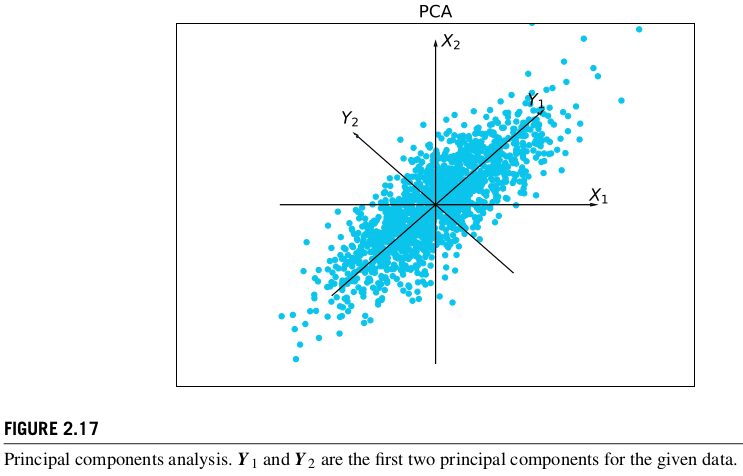
>
>  
> Han, J., Pei, J., & Tong, H. (2023). Data, measurements, and data preprocessing. In Elsevier eBooks (pp. 23–84). https://doi.org/10.1016/b978-0-12-811760-6.00012-6
> 

---



A more detailed explanation of PCA: (500 pages book)

Jolliffe, I. T. (2002). Principal component analysis. Springer New York.
 [[link]](http://cda.psych.uiuc.edu/statistical_learning_course/Jolliffe%20I.%20Principal%20Component%20Analysis%20(2ed.,%20Springer,%202002)(518s)_MVsa_.pdf)

<div class="alert alert-block alert-info" style="font-size:16px;">

> Imaginando que $X_1$ é **`income`** $X_2$ é **`frq`** $\rightarrow$ O mais importante no **PCA** é a variância dos dados. Não queremos usar a idade se esta tiver mais ou menos o mesmo intervalo nos dados!

> $Y_1$ e $Y_2$ são os componentes principais **PC1** e **PC2**, respetivamente.

- Temos de ver a projeção dos dados nos componentes principais. (Mudamos as coordenadas dos dados $(x_1, x_2)$ para as coordenadas dos componentes principais $(y_1, y_2)$)

> Ela disse que $\#PCs = \#Features$ e que o primeiro é o que tem mais variância, o segundo o segundo mais variância e assim por diante. (MENTIRA PQ DEPENDE DO ALGORITMO $\rightarrow$ ***Oblimin***, ***Varimax***, etc)


</div>

In [8]:
# Use PCA to reduce dimensionality of data
pca = PCA()
pca_feat = pca.fit_transform(df_pca[metric_features])
pca_feat  # What is this output?

array([[ 8.96355843e-01, -1.93769727e+00,  1.12078094e+00, ...,
        -3.68225182e-01,  7.57144679e-03, -3.41803775e-02],
       [ 1.98109196e+00, -1.42149763e+00,  7.85624710e-01, ...,
         8.40343856e-02,  2.96472237e-01,  8.65695579e-05],
       [-2.81310812e+00,  3.81439709e-01, -7.80866934e-01, ...,
        -3.33072182e-01,  2.03245751e-01,  5.59651800e-04],
       ...,
       [-1.00217094e+00,  1.30174688e+00, -4.23850692e-01, ...,
         6.04343566e-01,  4.90242146e-01,  5.98751392e-04],
       [ 1.30572939e-01, -9.59962207e-01,  3.32242312e-01, ...,
        -1.06980378e+00, -2.10380615e-01,  1.10264457e-03],
       [ 3.23101352e+00, -1.39485438e+00, -8.15823277e-01, ...,
         7.42146583e-01, -6.21596670e-01, -3.32314299e-02]])

### How many Principal Components to retain?



<div class="alert alert-block alert-info" style="font-size:16px;">

Some heuristics (rules of thumb):

Reference: **Jolliffe, I. T. (2002). Principal component analysis.**

Section 6.1: *How Many Principal Components?*

- 6.1.1. Cumulative percentage of total variance
  -  **Keep $80\%$ of the total variance**
- 6.1.2. Kaiser's rule
  - **Keep the components with eigenvalues greater than 1 $\rightarrow$ $PC \;var \ge 1$**
- 6.1.3. Scree plot
  - **Look for the "elbow" in the scree plot**

</div>


**Exercise:**

[Read the scikit-learn documentation about PCA](https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html)

Fill the correct values in the next cell:

In [9]:
# Get PCA output as table

# Get the eigenvalues (explained variance)
explained_variance = pca.explained_variance_ 

# Get the explained variance ratio
explained_variance_ratio = pca.explained_variance_ratio_ 

# get the cumulative explained variance ratio 
# Hint: use np.cumsum()
cumulative_explained_variance_ratio = np.cumsum(pca.explained_variance_ratio_)          

# Combine into a dataframe
pca_results = pd.DataFrame(
    {
        "Eigenvalue": explained_variance,
        "Difference": np.insert(np.diff(explained_variance), 0, 0),
        "Proportion": explained_variance_ratio,
        "Cumulative": cumulative_explained_variance_ratio
    },
        index=range(1, pca.n_components_ + 1)
)

pca_results

,Eigenvalue,Difference,Proportion,Cumulative
1,3.517240,0.000000,0.351684,0.351684
2,2.410059,-1.107181,0.240979,0.592663
3,1.049154,-1.360905,0.104903,0.697566
4,0.987316,-0.061838,0.098720,0.796286
5,0.690990,-0.296326,0.069091,0.865378
6,0.562523,-0.128467,0.056246,0.921623
7,0.544539,-0.017983,0.054448,0.976071
8,0.155019,-0.389520,0.015500,0.991571
9,0.083986,-0.071033,0.008398,0.999969
10,0.000310,-0.083677,0.000031,1.000000


<div class="alert alert-block alert-info" style="font-size:16px;">

> **2nd Rule of Thumb:** Keep the components with eigenvalues greater than 1 $\rightarrow$ $PC \;var \ge 1$ $\rightarrow$ **`n_components` = 3** (Todos os PCs que têm *Eigenvalues* maiores que 1, sem arredondar)

**Now let's plot the results**

*[What's a "scree"?](https://en.wikipedia.org/wiki/Scree)*

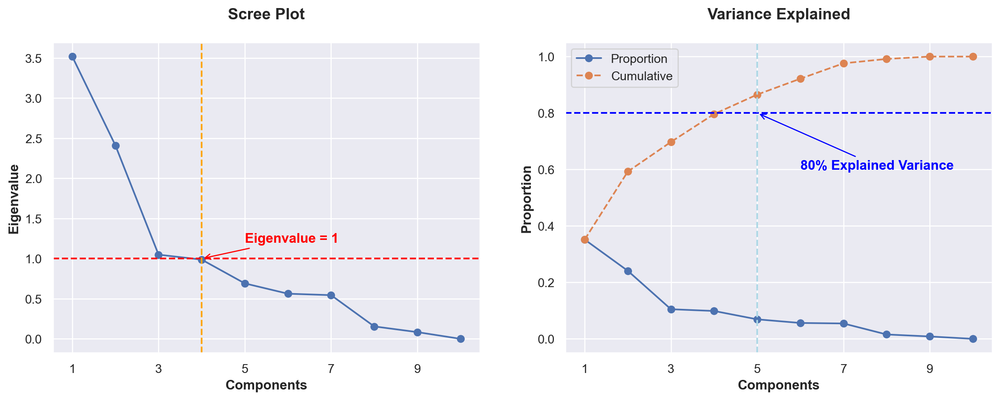

In [23]:
# figure and axes
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

# draw plots

ax1.plot(explained_variance, # PLOT THE EIGENVALUES (EXPLAINED VARIANCE)
         marker=".", markersize=12)

ax2.plot(explained_variance_ratio, # PLOT THE EXPLAINED VARIANCE RATIO
         marker=".", markersize=12, label="Proportion")

ax2.plot(cumulative_explained_variance_ratio, # PLOT THE CUMULATIVE EXPLAINED VARIANCE RATIO
         marker=".", markersize=12, linestyle="--", label="Cumulative")

# customizations
ax2.legend()
ax1.set_title("Scree Plot\n", fontsize=14, fontweight="bold")
ax2.set_title("Variance Explained\n", fontsize=14, fontweight="bold")
ax1.set_ylabel("Eigenvalue", fontsize=12, fontweight="bold")
ax2.set_ylabel("Proportion", fontsize=12, fontweight="bold")
ax1.set_xlabel("Components", fontsize=12, fontweight="bold")
ax2.set_xlabel("Components", fontsize=12, fontweight="bold")
ax1.set_xticks(range(0, pca.n_components_, 2))
ax1.set_xticklabels(range(1, pca.n_components_ + 1, 2))
ax2.set_xticks(range(0, pca.n_components_, 2))
ax2.set_xticklabels(range(1, pca.n_components_ + 1, 2))

# Add Lines and Annotations
ax1.axhline(1, color="red", linestyle="--")
ax1.annotate("Eigenvalue = 1", (3, 1), (4, 1.2), arrowprops={"arrowstyle": "->", "color": "red"}, fontsize=12, color="red", fontweight="bold")
ax1.axvline(3, color="orange", linestyle="--")

ax2.axhline(0.8, color="blue", linestyle="--")
ax2.annotate("80% Explained Variance", (4, 0.8), (5, 0.6), arrowprops={"arrowstyle": "->", "color": "blue"}, fontsize=12, color="blue", fontweight="bold")
ax2.axvline(4, color="lightblue", linestyle="--")

plt.show()

<div class="alert alert-block alert-info" style="font-size:16px;">

> **1st Rule of Thumb:** Keep $80\%$ of the total variance $\rightarrow$ **`n_components=4`** (Estamos a analisar o gráfico da variância acumulada - direita)

> **2nd & 3rd Rule of Thumb:** Keep the components with eigenvalues greater than 1 $\rightarrow$ $PC \;var \ge 1$ $\rightarrow$ **`n_components` = 3** (Todos os PCs que têm *Eigenvalues* maiores que 1, sem arredondar) (Confirmamos com o gráfico da esquerda - *Scree plot*)

</div>

In [ ]:
# Perform PCA again with the number of principal components you want to retain
pca = PCA(n_components=4)
pca_feat = pca.fit_transform(df_pca[metric_features])
pca_feat_names = [f"PC{i}" for i in range(pca.n_components_)]

# remember index=df_pca.index
pca_df = pd.DataFrame(pca_feat, index=df_pca.index, columns=pca_feat_names)  
pca_df

,PC0,PC1,PC2,PC3
0,0.896356,-1.937697,1.120781,0.195583
1,1.981092,-1.421498,0.785625,-1.754773
2,-2.813108,0.381440,-0.780867,0.765061
3,1.247013,-0.514177,-1.302203,-0.958158
4,1.781920,-0.704805,-0.443376,-0.665780
...,...,...,...,...
8812,1.162525,-0.372854,-0.982963,-1.414254
8813,2.003026,0.083121,-1.428619,-1.229687
8814,-1.002171,1.301747,-0.423851,-1.582317
8815,0.130573,-0.959962,0.332242,0.642089


In [ ]:
# Reassigning df to contain pca variables
df_pca = pd.concat([df_pca, pca_df], axis=1)
df_pca.head()

,age,income,frq,rcn,mnt,clothes,kitchen,small_appliances,toys,house_keeping,...,oh_gender_M,oh_dependents_1.0,oh_description_Kind of OK,oh_description_Meh...,oh_description_OK nice!,oh_description_Take my money!!,PC0,PC1,PC2,PC3
0,1946,0.743162,1.191605,0.457819,1402,-0.617023,-0.243065,1.216847,0.495837,-0.499274,...,1.0,0.0,0.0,0.0,0.0,1.0,0.896356,-1.937697,1.120781,0.195583
1,1936,1.559488,1.100011,-1.535723,1537,0.166160,-0.790228,0.740464,-0.374374,-0.631907,...,0.0,0.0,0.0,0.0,0.0,1.0,1.981092,-1.421498,0.785625,-1.754773
2,1990,-1.548542,-0.823463,0.557496,44,-0.834573,1.672006,-0.371096,-0.809480,2.286023,...,1.0,1.0,1.0,0.0,0.0,0.0,-2.813108,0.381440,-0.780867,0.765061
3,1955,0.845528,0.550447,-1.402820,888,0.383710,0.440889,-0.768082,-0.084304,-0.234007,...,0.0,1.0,0.0,0.0,1.0,0.0,1.247013,-0.514177,-1.302203,-0.958158
4,1955,0.782435,1.008417,-0.871209,1138,0.340200,-0.243065,-0.053508,-0.374374,-0.366640,...,0.0,1.0,0.0,0.0,0.0,1.0,1.781920,-0.704805,-0.443376,-0.665780


### **How do we interpret each Principal Component (with style)?**

In [ ]:
# CODE HERE: Get the loadings (i.e. the correlations between Principal Components and the original features)
# Hint: Use df.corr()
# Hint: Filter the correlation matrix to show the PC as columns, and original features as rows

# Loadings
loadings = df_pca[metric_features + pca_feat_names].corr().loc[metric_features, pca_feat_names]

In [ ]:
def _color_red_or_green(val):
    if val < -0.45:
        color = 'background-color: #ffbdbd'
    elif val > 0.45:
        color = 'background-color: #b3ffcc'
    else:
        color = ''
    return color


# Interpreting each Principal Component
loadings.style.map(_color_red_or_green)

,PC0,PC1,PC2,PC3
income,0.761685,-0.540094,0.018431,0.023422
frq,0.721397,-0.611818,-0.073602,0.056624
rcn,-0.079469,0.054347,0.336283,0.936716
clothes,0.725825,0.663924,-0.120159,0.042836
kitchen,-0.593659,-0.426527,-0.310401,0.105049
small_appliances,-0.299670,-0.486007,0.735376,-0.246379
toys,-0.586692,-0.436593,-0.276705,0.075150
house_keeping,-0.602303,-0.402634,-0.308481,0.109447
per_net_purchase,-0.453846,0.659506,-0.129912,0.010763
spent_online,0.726594,-0.306940,-0.300038,0.121233


<div class="alert alert-block alert-warning" style="font-size:16px;">

> **Loadings** (Cargas) $\rightarrow$ **`components_`** (Matriz de rotação)

- Os **loadings** são os coeficientes que multiplicam as variáveis originais para obter os componentes principais.

<br><br>

- O problema dos PCs vai ser depois interpretar nos ***Clusters*** 
  - (p.e., ***Cluster A*** elevado valor de **PC0** $\rightarrow$ mas o **PC0** é uma combinação de **`income`**, **`frq`**, **`clothes`**, **`spent_online`**) 
  - (p.e. ***Cluster B*** elevado valor de **PC1** $\rightarrow$ mas o **PC1** é uma combinação ....)

- **Prof Fernando Bação:** *"Não gosta de usar PCs no Clustering pq se perde interpretabilidade e explicabilidade"*
 
</div>

> **Explained Variance** (Variância explicada) $\rightarrow$ **`explained_variance_`** (Variância explicada por cada PC)

> **Explained Variance Ratio** (Rácio de variância explicada) $\rightarrow$ **`explained_variance_ratio_`** (Rácio de variância explicada por cada PC)

In [ ]:
df = df_pca.copy()

**Some final data preprocessing**

In [ ]:
# Do this after checking the new pandas profiling report
# DROP PC3. 
df.drop(columns=['PC3'], inplace=True)

<div class="alert alert-block alert-warning">

### **Why?**

> Why? Because **PC3** has only a high value in the **`rcn`** variable $\rightarrow$ Para isso mais vale usar a variável original! (Não faz sentido usar o **PC3**)

In [ ]:
df

,age,income,frq,rcn,mnt,clothes,kitchen,small_appliances,toys,house_keeping,...,oh_status_Widow,oh_gender_M,oh_dependents_1.0,oh_description_Kind of OK,oh_description_Meh...,oh_description_OK nice!,oh_description_Take my money!!,PC0,PC1,PC2
0,1946,0.743162,1.191605,0.457819,1402,-0.617023,-0.243065,1.216847,0.495837,-0.499274,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.896356,-1.937697,1.120781
1,1936,1.559488,1.100011,-1.535723,1537,0.166160,-0.790228,0.740464,-0.374374,-0.631907,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.981092,-1.421498,0.785625
2,1990,-1.548542,-0.823463,0.557496,44,-0.834573,1.672006,-0.371096,-0.809480,2.286023,...,0.0,1.0,1.0,1.0,0.0,0.0,0.0,-2.813108,0.381440,-0.780867
3,1955,0.845528,0.550447,-1.402820,888,0.383710,0.440889,-0.768082,-0.084304,-0.234007,...,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.247013,-0.514177,-1.302203
4,1955,0.782435,1.008417,-0.871209,1138,0.340200,-0.243065,-0.053508,-0.374374,-0.366640,...,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.781920,-0.704805,-0.443376
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8812,1954,0.618993,0.458853,-1.701851,837,0.209670,0.167308,-0.132905,0.205767,-0.764540,...,0.0,1.0,1.0,1.0,0.0,0.0,0.0,1.162525,-0.372854,-0.982963
8813,1960,0.874744,0.733635,-1.701851,896,0.731791,-0.243065,-0.609288,-0.519409,-0.366640,...,0.0,0.0,1.0,0.0,0.0,0.0,1.0,2.003026,0.083121,-1.428619
8814,1975,-0.455617,-0.731869,-1.535723,61,0.079139,-0.106274,-0.053508,0.060732,-0.101374,...,0.0,1.0,1.0,0.0,1.0,0.0,0.0,-1.002171,1.301747,-0.423851
8815,1986,-0.596155,0.825229,0.657173,1011,-0.442982,0.577680,0.581670,-0.809480,0.561792,...,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.130573,-0.959962,0.332242


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8817 entries, 0 to 8816
Data columns (total 35 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   age                             8817 non-null   int64  
 1   income                          8817 non-null   float64
 2   frq                             8817 non-null   float64
 3   rcn                             8817 non-null   float64
 4   mnt                             8817 non-null   int64  
 5   clothes                         8817 non-null   float64
 6   kitchen                         8817 non-null   float64
 7   small_appliances                8817 non-null   float64
 8   toys                            8817 non-null   float64
 9   house_keeping                   8817 non-null   float64
 10  dependents                      8817 non-null   bool   
 11  per_net_purchase                8817 non-null   float64
 12  gender                          88

## Redo data exploration

Check if the data looks the way you expect it to. 

- Have you missed some outliers? 
- Are there still missing values?
- Is the data normalized?

This is an iterative process. It is likely you will change your preprocessing steps frequently throughout your group work.

In [ ]:
from ydata_profiling import ProfileReport

ProfileReport(
    df,
    title='Tugas Customer Data Preprocessed',
    correlations={
        "pearson": {"calculate": True},
        "spearman": {"calculate": False},
        "kendall": {"calculate": False},
        "phi_k": {"calculate": False},
        "cramers": {"calculate": False},
    },
)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

**Is everything as you expect it to be? Save the data for later use.**

In [ ]:
df.to_csv(os.path.join("..", "data", "tugas_preprocessed.csv"), index=False)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8817 entries, 0 to 8816
Data columns (total 35 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   age                             8817 non-null   int64  
 1   income                          8817 non-null   float64
 2   frq                             8817 non-null   float64
 3   rcn                             8817 non-null   float64
 4   mnt                             8817 non-null   int64  
 5   clothes                         8817 non-null   float64
 6   kitchen                         8817 non-null   float64
 7   small_appliances                8817 non-null   float64
 8   toys                            8817 non-null   float64
 9   house_keeping                   8817 non-null   float64
 10  dependents                      8817 non-null   bool   
 11  per_net_purchase                8817 non-null   float64
 12  gender                          88

## **Some References**  | Data Preprocessing

**Data Mining Concepts and Techniques 4th ed.**

Sections:
- 2.4: Data quality, data cleaning, and data integration
- 2.5: Data transformation
- 2.6: Dimensionality reduction

Han, J., Pei, J., & Tong, H. (2022). *Data mining: Concepts and Techniques*. Morgan Kaufmann.

**Data Mining Concepts and Techniques 3rd ed.**

Chapter 3: Data Preprocessing

Han, J., Kamber, M. & Pei, J. (2012). *Data mining concepts and techniques*, third edition Morgan Kaufmann Publishers


##### Principal Components Analysis

Book:

**Principal component analysis**

Jolliffe, I. T. (2002). Principal component analysis. Springer New York.

Websites:

https://builtin.com/data-science/step-step-explanation-principal-component-analysis

---